In [ ]:
#| default_exp asynk

# Async versions

Thanks to the way the Genai SDK is structured and how Gaspare was built, apart from patching the async classes with the same methods we have built we only need async versions of three methods: `_r`, `_stream` and `structured`. To make sure that they stay up to date in the future, it's a better idea to keep those three async method definition close to their synchronous ones, so the code does not drift when changes happen. We'll keep in this separate model only the constructor functions.

In [ ]:
#| exports

from gaspare import *

import os

from google import genai

from fastcore.all import *

In [ ]:
#| exports

def AsyncClient(model:str, # The model to be used by default (can be overridden when generating)
           sp:str='', # System prompt
           temp:float=0.6, # Default temperature
           text_only:bool=False, # Suppress multimodality even if the model allows for it
          ): 
    cli = genai.Client(api_key=os.environ['GEMINI_API_KEY'])
    c = cli.aio
    c.models.post_cbs = [c.models._call_tools]
    c.models.model, c.models.sp, c.models.temp, c.models.text_only = model, sp, temp, text_only
    return c


def AsyncChat(model:str, # The model to be used 
           sp:str='', # System prompt
           temp:float=0.6, # Default temperature
           text_only:bool=False, # Suppress multimodality even if the model allows for it
           cli:genai.client.AsyncClient|None=None, # Optional Client to be passed (to keep track of usage)
          ):
    c = AsyncClient(model, sp, temp, text_only) if cli is None else cli
    c.model, c.sp, c.temp, c.text_only = model, sp, temp, text_only
    chat = c.chats.create(model=c.model)
    chat.c.post_cbs.insert(0, chat._rec_res)
    return chat

## Testing the AsyncClient

Everything should work with exactly the same api, just adding an `await` in front of it

In [ ]:
cli = AsyncClient(models[0])

In [ ]:
await cli("Hi there")

Hi! How can I help you today?


<details><ul><li><code>usage_metadata</code>: Cached: 0; In: 2; Out: 10; Total: 12</li><li><code>automatic_function_calling_history</code>: </li><li><code>model_version</code>: gemini-2.0-flash</li><li><code>candidates</code>: <details open='true'><summary>candidates[0]</summary><ul><li><code>avg_logprobs</code>: -0.009500809758901597</li><li><code>content</code>: <ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>text</code>: Hi! How can I help you today?
</li></ul></details></li></ul></li><li><code>finish_reason</code>: FinishReason.STOP</li></ul></details></li></ul></details>

In [ ]:
cli.use

Cached: 0; In: 2; Out: 10; Total: 12

In [ ]:
s = cli("write me a haiku", stream=True)

In [ ]:
async for c in await s: print(c, end='')

Green leaves softly sway,
Sunlight warms the gentle breeze,
Nature's peace unfolds.


Since we did not need an async `__call__` method, we could have had the method return an async generator rather than a coroutine (which would have meant in this case `async for c in s` would have been the way to make it work rather than `async for c in **await** s`)). To keep compatibility with Claudette's async client, we wrap the async generator in a coroutine to be awaited, even if it technically adds a slight overhead.

In [ ]:
cli.use

Cached: 0; In: 6; Out: 30; Total: 36

In [ ]:
def sums(
    a:int,  # First thing to sum
    b:int=1 # Second thing to sum
) -> int: # The sum of the inputs
    "Adds a + b."
    print(f"Finding the sum of {a} and {b}")
    return a + b

In [ ]:
a,b = 604542,6458932
pr = f"What is {a}+{b}?"
sp = "You are a summing expert."

In [ ]:
r = await cli(pr, sp=sp, tools=[sums], use_afc=True)
r

Finding the sum of 604542 and 6458932


The sum of 604542 and 6458932 is 7063474.
<details><ul><li><code>usage_metadata</code>: Cached: 0; In: 66; Out: 29; Total: 95</li><li><code>automatic_function_calling_history</code>: <details open='true'><summary>automatic_function_calling_history[0]</summary><ul><li><code>role</code>: user</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>text</code>: What is 604542+6458932?</li></ul></details></li></ul></details>
<details open='true'><summary>automatic_function_calling_history[1]</summary><ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>function_call</code>: <ul><li><code>name</code>: sums</li><li><code>args</code>: <ul><li><b>a</b>: 604542</li>
<li><b>b</b>: 6458932</li></ul></li></ul></li></ul></details></li></ul></details>
<details open='true'><summary>automatic_function_calling_history[2]</summary><ul><li><code>role</code>: user</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>function_response</code>: <ul><li><code>name</code>: sums</li><li><code>response</code>: <ul><li><b>result</b>: 7063474</li></ul></li></ul></li></ul></details></li></ul></details></li><li><code>model_version</code>: gemini-2.0-flash</li><li><code>candidates</code>: <details open='true'><summary>candidates[0]</summary><ul><li><code>avg_logprobs</code>: -0.021660833523191255</li><li><code>content</code>: <ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>text</code>: The sum of 604542 and 6458932 is 7063474.</li></ul></details></li></ul></li><li><code>finish_reason</code>: FinishReason.STOP</li></ul></details></li></ul></details>

In [ ]:
r = await cli(pr, sp=sp, tools=[sums], use_afc=False)
r

Finding the sum of 604542 and 6458932


<ul><li><code>sums(a=604542, b=6458932)</code></li></ul>
<details><ul><li><code>usage_metadata</code>: Cached: 0; In: 70; Out: 3; Total: 73</li><li><code>automatic_function_calling_history</code>: </li><li><code>model_version</code>: gemini-2.0-flash</li><li><code>candidates</code>: <details open='true'><summary>candidates[0]</summary><ul><li><code>avg_logprobs</code>: 1.1818580484638611e-05</li><li><code>content</code>: <ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>function_call</code>: <ul><li><code>name</code>: sums</li><li><code>args</code>: <ul><li><b>a</b>: 604542</li>
<li><b>b</b>: 6458932</li></ul></li></ul></li></ul></details></li></ul></li><li><code>finish_reason</code>: FinishReason.STOP</li></ul></details></li></ul></details>

In [ ]:
await cli.structured(pr, sums)


Finding the sum of 604542 and 6458932


[7063474]

<div style="width: 200px; height: auto;">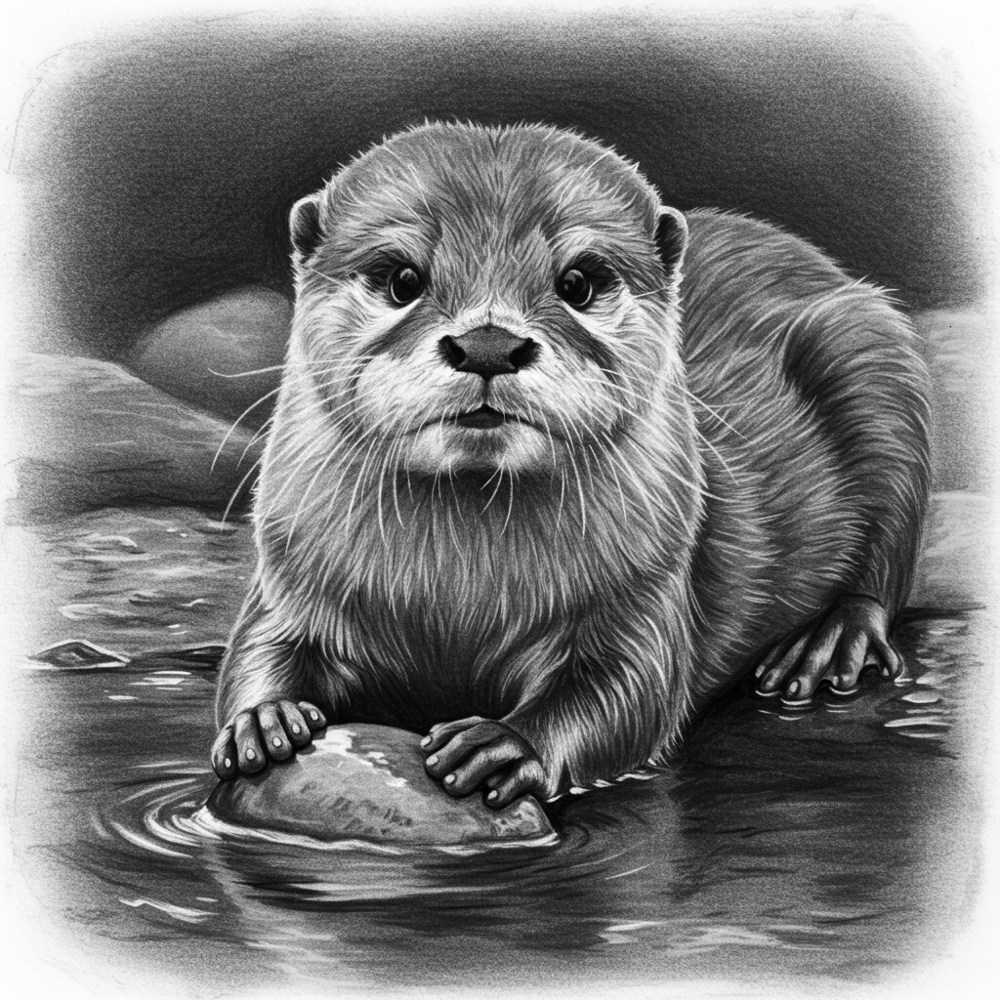</div>
<details><ul><li><code>generated_images</code>: <details open='true'><summary>generated_images[0]</summary><ul><li><code>image</code>: <ul><li><code>image_bytes</code>: b'\x89PNG\r\n\x1a\n\x00\x00...'</li><li><code>mime_type</code>: image/png</li></ul></li></ul></details></li></ul></details>

In [ ]:
await cli.imagen("Charcoal drawing of a cute otter")

In [ ]:
await cli("count to 10", stop="3")

Okay, here we go:



1

2


<details><ul><li><code>usage_metadata</code>: Cached: 0; In: 5; Out: 11; Total: 16</li><li><code>automatic_function_calling_history</code>: </li><li><code>model_version</code>: gemini-2.0-flash</li><li><code>candidates</code>: <details open='true'><summary>candidates[0]</summary><ul><li><code>avg_logprobs</code>: -0.15975962985645642</li><li><code>content</code>: <ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>text</code>: Okay, here we go:

1
2
</li></ul></details></li></ul></li><li><code>finish_reason</code>: FinishReason.STOP</li></ul></details></li></ul></details>

In [ ]:
cli

Okay, here we go:



1

2


<details><ul><li><code>usage_metadata</code>: Cached: 0; In: 5; Out: 11; Total: 16</li><li><code>automatic_function_calling_history</code>: </li><li><code>model_version</code>: gemini-2.0-flash</li><li><code>candidates</code>: <details open='true'><summary>candidates[0]</summary><ul><li><code>avg_logprobs</code>: -0.15975962985645642</li><li><code>content</code>: <ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>text</code>: Okay, here we go:

1
2
</li></ul></details></li></ul></li><li><code>finish_reason</code>: FinishReason.STOP</li></ul></details></li></ul></details>


|        | Input | Output | Cached |
|--------|------:|-------:|-------:|
| Tokens | 211 | 76  | 0  |
| **Totals** | **Tokens: 287** | **$0.000052** |  |


## Testing the AsyncChat

Once again, everything should just work with an `await` in front.

In [ ]:
chat = AsyncChat(model=models[0])

In [ ]:
await chat("Hi, I am Miko")

Hi Miko! It's nice to meet you. How can I help you today?


<details><ul><li><code>usage_metadata</code>: Cached: 0; In: 5; Out: 19; Total: 24</li><li><code>automatic_function_calling_history</code>: </li><li><code>model_version</code>: gemini-2.0-flash</li><li><code>candidates</code>: <details open='true'><summary>candidates[0]</summary><ul><li><code>avg_logprobs</code>: -0.006754375602069654</li><li><code>content</code>: <ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>text</code>: Hi Miko! It's nice to meet you. How can I help you today?
</li></ul></details></li></ul></li><li><code>finish_reason</code>: FinishReason.STOP</li></ul></details></li></ul></details>

In [ ]:
await chat("What is my name again?")

Your name is Miko.


<details><ul><li><code>usage_metadata</code>: Cached: 0; In: 30; Out: 6; Total: 36</li><li><code>automatic_function_calling_history</code>: </li><li><code>model_version</code>: gemini-2.0-flash</li><li><code>candidates</code>: <details open='true'><summary>candidates[0]</summary><ul><li><code>avg_logprobs</code>: -0.002763839748998483</li><li><code>content</code>: <ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>text</code>: Your name is Miko.
</li></ul></details></li></ul></li><li><code>finish_reason</code>: FinishReason.STOP</li></ul></details></li></ul></details>

In [ ]:
pr = f"What is {a}+{b}?"
r = await chat(pr, tools=[sums])
r

Finding the sum of 604542 and 6458932


<ul><li><code>sums(a=604542, b=6458932)</code></li></ul>
<details><ul><li><code>usage_metadata</code>: Cached: 0; In: 143; Out: 3; Total: 146</li><li><code>automatic_function_calling_history</code>: </li><li><code>model_version</code>: gemini-2.0-flash</li><li><code>candidates</code>: <details open='true'><summary>candidates[0]</summary><ul><li><code>avg_logprobs</code>: 2.1037994883954525e-06</li><li><code>content</code>: <ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>function_call</code>: <ul><li><code>name</code>: sums</li><li><code>args</code>: <ul><li><b>a</b>: 604542</li>
<li><b>b</b>: 6458932</li></ul></li></ul></li></ul></details></li></ul></li><li><code>finish_reason</code>: FinishReason.STOP</li></ul></details></li></ul></details>

In [ ]:
await chat()

The answer is 7063474.


<details><ul><li><code>usage_metadata</code>: Cached: 0; In: 102; Out: 13; Total: 115</li><li><code>automatic_function_calling_history</code>: </li><li><code>model_version</code>: gemini-2.0-flash</li><li><code>candidates</code>: <details open='true'><summary>candidates[0]</summary><ul><li><code>avg_logprobs</code>: -0.1015774470109206</li><li><code>content</code>: <ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>text</code>: The answer is 7063474.
</li></ul></details></li></ul></li><li><code>finish_reason</code>: FinishReason.STOP</li></ul></details></li></ul></details>

In [ ]:
await chat(["Write a haiku about this image", "../examples/match.png"])

Feathered fists clash now,

Otter and bird in the ring,

Crowd roars, dogs all cheer.


<details><ul><li><code>usage_metadata</code>: Cached: 0; In: 1411; Out: 23; Total: 1434</li><li><code>automatic_function_calling_history</code>: </li><li><code>model_version</code>: gemini-2.0-flash</li><li><code>candidates</code>: <details open='true'><summary>candidates[0]</summary><ul><li><code>avg_logprobs</code>: -0.4689888746842094</li><li><code>content</code>: <ul><li><code>role</code>: model</li><li><code>parts</code>: <details open='true'><summary>parts[0]</summary><ul><li><code>text</code>: Feathered fists clash now,
Otter and bird in the ring,
Crowd roars, dogs all cheer.
</li></ul></details></li></ul></li><li><code>finish_reason</code>: FinishReason.STOP</li></ul></details></li></ul></details>

In [ ]:
async for chunk in await chat("Now do a short poem on it", stream=True): print(chunk, end='')

In mosaic's gleam, a boxing ring,
A bird of old, with feathered swing.
Against an otter, sleek and brown,
Before a cheering, canine town.
A Sasquatch looms, a watchful eye,
As ancient battles reach for sky.
The referee stands, stripes so neat,
A whimsical, historic feat.


In [ ]:
chat

In mosaic's gleam, a boxing ring,

A bird of old, with feathered swing.

Against an otter, sleek and brown,

Before a cheering, canine town.

A Sasquatch looms, a watchful eye,

As ancient battles reach for sky.

The referee stands, stripes so neat,

A whimsical, historic feat.




<details>
<summary>History</summary>

_**user**_: Hi, I am Miko

_**model**_: Hi Miko! It's nice to meet you. How can I help you today?


_**user**_: What is my name again?

_**model**_: Your name is Miko.


_**user**_: What is 604542+6458932?

_**model**_: 604542 + 6458932 = 7063474


_**user**_: What is 604542+6458932?

_**model**_: 

_**tool**_: 

_**model**_: The answer is 7063474.


_**user**_: Write a haiku about this imageIMAGE_0

_**model**_: Feathered fists clash now,
Otter and bird in the ring,
Crowd roars, dogs all cheer.


_**user**_: Now do a short poem on it

_**model**_: In mosaic's gleam, a boxing ring,
A bird of old, with feathered swing.
Against an otter, sleek and brown,
Before a cheering, canine town.
A Sasquatch looms, a watchful eye,
As ancient battles reach for sky.
The referee stands, stripes so neat,
A whimsical, historic feat.

</details>


|        | Input | Output | Cached |
|--------|------:|-------:|-------:|
| Tokens | 3,186 | 161  | 0  |
| **Totals** | **Tokens: 3,347** | **$0.000383** |  |


In [ ]:
#|hide
#|eval: false

import nbdev; nbdev.nbdev_export()